# environment setting
reqirement : cuda,tensorFLow.etc..



# data pre-processing

## Vocal extraction by Waveunet
Vocal extracion from signal datas by using Waveunet, cnn network designed for separating vocal from song 

In [ ]:
from Predict import ex
song_list=['gift_mix.mp3']
local_path=['C:/Users/wnduq/Desktop/input_music/{}','C:/Users/wnduq/Desktop/output_music/{}']
for i in song_list:
    r = ex.run(named_configs=['cfg.full_44KHz'],
              config_updates={'input_path': local_path[0].format(i),
                             'output_path' : local_path[1].format(i[:len(i)-3])})

## sampling
sampling from continuous signal to create discrete array data. 
to do this, choose the sampling tate, that determines how tight intervals between samples are 

In [17]:
import librosa
local_path=['C:/Users/wnduq/Desktop/input_music/{}','C:/Users/wnduq/Desktop/output_music/{}']
vocal_only = local_path[1].format('gift_mix/gift_mix.mp3_vocals.wav')
mixed = local_path[0].format('gift_mix.mp3')
x , sr_x = librosa.load(vocal_only) #default sr is 22KHZ
y, sr_y = librosa.load(mixed)
print(x.shape, sr_x)
print(y.shape, sr_y)

(662424,) 22050
(662424,) 22050


In [19]:
#cheak audio
import IPython.display as ipd
ipd.Audio(vocal_only)

In [20]:
ipd.Audio(mixed)

Text(0.5, 1.0, 'vocal_only')

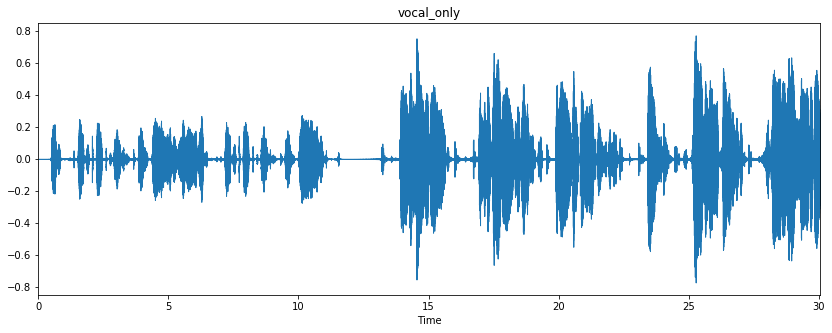

In [21]:
%matplotlib inline 
import matplotlib.pyplot as plt
import librosa.display
plt.figure(figsize=(14, 5))
librosa.display.waveplot(x, sr=sr_x)
plt.title('vocal_only')

Text(0.5, 1.0, 'mixed')

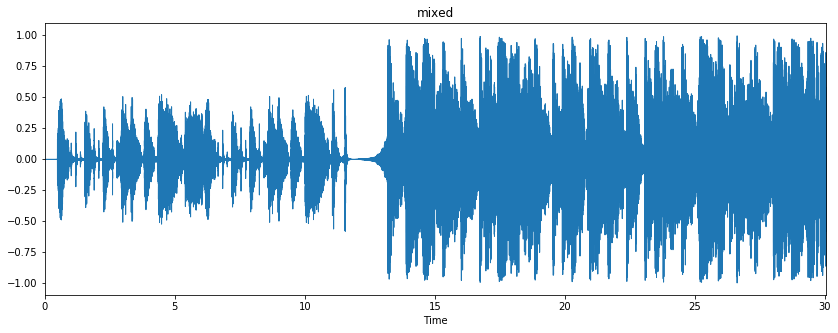

In [22]:
%matplotlib inline 
plt.figure(figsize=(14, 5))
librosa.display.waveplot(y, sr=sr_y)
plt.title('mixed')

## spectogram
시간의 따른 신호 강도의 변화를 보여주는 그림, 신호의 세기는 얼마나 소리가 큰 가를 의미한다.
FFT을 이용하여 만들어준다.


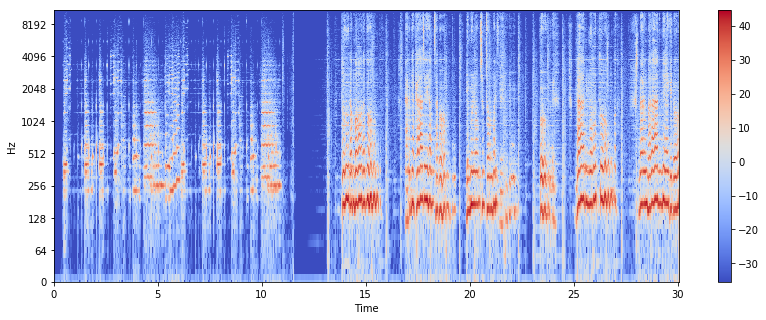

In [30]:
%matplotlib inline
X = librosa.stft(x)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(14,5))
librosa.display.specshow(Xdb,sr=sr_x,x_axis='time',y_axis='log')
#y축 진동수에 로그 취해줘서 좀더 변화를 크게본다
plt.colorbar()

## feature extraction
### Mel-Frequency Cepstral Coefficients(MFCCs)
10~20개의 스펙트럼의 subset, 인간의 청각 시스템을 모델링해서 고음역대의 변화에 덜 민감하게 필터링

(20, 1294)


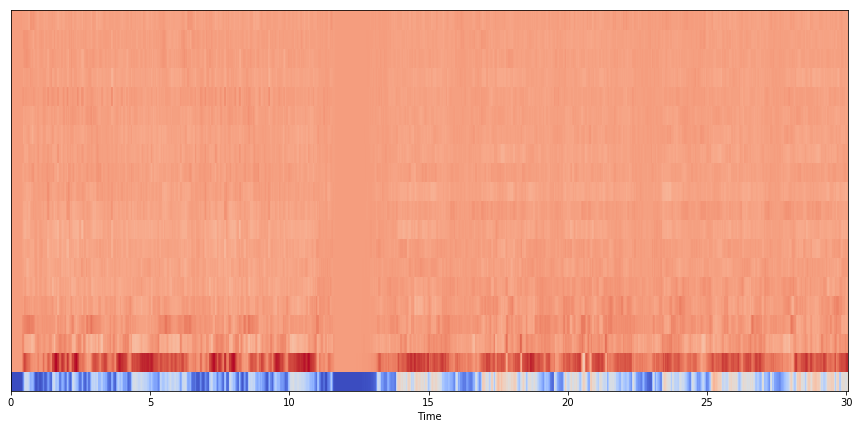

In [35]:
mfcc = librosa.feature.mfcc(x,sr=sr_x)
print(mfcc.shape)
plt.figure(figsize=(15,7))
librosa.display.specshow(mfcc,sr=sr_x, x_axis='time')

In [ ]:
모든 노래에 Spectogram 만들어주고 -> CNN
MFCC,etc 다붙여서 특징 만들어준다. -> DNN 